# Baseline implementation
We first put all stereo patchmatching code in class here. For simplify our task, we assume all image pairs are rectified.
Then let's imporve this code

In [1]:
# Data from https://vision.middlebury.edu/stereo/data/scenes2005/
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from PIL import Image
import os
import re
import scipy.signal
import cv2
from tqdm import tqdm

# Load the images
def load_image_gray(filepath):
    """Loads an image into a numpy array.
    Note: image will have 3 color channels [r, g, b]."""
    img = Image.open(filepath)
    img = np.asarray(img).astype(float)/255
    if len(img.shape) > 2:
        return img[:, :, 0]
    else:
        return img

image_a = load_image_gray('data/Art/view1.png')
image_b = load_image_gray('data/Art/view5.png')
gt_a = load_image_gray('data/Art/disp1.png')
gt_b = load_image_gray('data/Art/disp5.png')

## Plotting Code
# plt.figure(figsize=(12, 5))
# ax_a = plt.subplot(1, 2, 1)
# plt.imshow(image_a, cmap='gray')
# ax_b = plt.subplot(1, 2, 2)
# plt.imshow(image_b, cmap='gray')


def get_patch(image, x, y, patch_half_width):
    return image[y-patch_half_width:y+patch_half_width+1,
                 x-patch_half_width:x+patch_half_width+1]

def compute_match_score_ssd(patch_a, patch_b):
    ssd = -((patch_a - patch_b)**2).sum()
    return ssd
    
def compute_match_score_ncc(patch_a, patch_b):
    # compute the mean of both patches
    pa_m = patch_a.mean()
    pb_m = patch_b.mean()
    # compute the std of both patches
    pa_std = np.sqrt(((patch_a - pa_m)**2).sum())
    pb_std = np.sqrt(((patch_b - pb_m)**2).sum())
    return ((patch_a - pa_m)*(patch_b - pb_m)).sum()/pa_std/pb_std

def patch_match_stereo(image_a, image_b, x_a, y_a,
                       match_score_fn,
                       patch_half_width=9):
    """Returns the location of a feature/patch between stereo images.
    Inputs are the x, y coordinates of the patch in image_a.
    Outputs are the x, y coordinates of the patch in image_b."""

    # (1) Get the patch in image a
    patch_a = get_patch(image_a, x_a, y_a, 
                        patch_half_width=patch_half_width)

    # (2) Compute the responses along the epipolar line in image b
    # Define the possible coordinates along with the match might be found
    # (You should feel free to modify this code if you have a simpler
    # way to represent this operation.)
    possible_coordinates = None
    '''Chuan's code'''
    # since we know this is a rectified image pair, so we can simply
    # copy the height coordinate of patch in image a
    possible_coordinates = np.zeros((image_b.shape[1]-2*patch_half_width,2))
    y_b = y_a
    x_b = np.arange(patch_half_width, image_b.shape[1]-patch_half_width)
    possible_coordinates[:,0] = x_b
    possible_coordinates[:,1] = y_b
    possible_coordinates = possible_coordinates.astype(int)
    '''Chuan's code'''
    if possible_coordinates is None:
        raise NotImplementedError()

    response = np.zeros((len(possible_coordinates)))
    for ind, (x_b, y_b) in enumerate(possible_coordinates):
        # Get the patch
        patch_b = get_patch(image_b, x_b, y_b,
                            patch_half_width=patch_half_width)
        # Compute the match score & store
        response[ind] = match_score_fn(patch_a, patch_b)
    
    # (3) Compute the maximum response
    ind = np.argmax(response)
    x_b, y_b = possible_coordinates[ind]

    return x_b, y_b, response[ind]

136it [06:16,  2.77s/it]
136it [30:41, 13.54s/it]


Text(0.5, 1.0, 'Depth Map (NCC)')

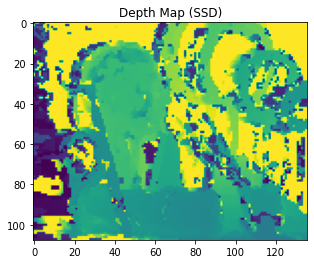

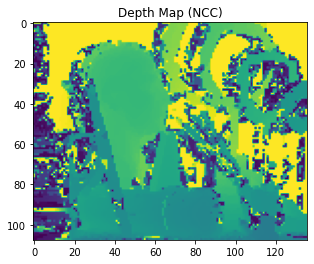

In [5]:
## Chuan: this block will take about 30 mins to run on my Mac

# Compute and plot the depth maps
# You should not change these for your final plot, but if you were
# to reduce the "patch half width" (phw) or increase spacing for
# testing purposes, you should feel free to do so.
phw = 15
spacing = 10

def compute_depth_map(image_a, image_b, match_score_fn):
    xs = range(phw, image_b.shape[1]-phw, spacing)
    ys = range(phw, image_b.shape[0]-phw, spacing)
    disparity_mat = np.zeros((len(ys), len(xs)))
    responses_mat = np.zeros((len(ys), len(xs)))
    for xi, x_a in tqdm(enumerate(xs)):
        # print(f"Progress: {xi}/{len(xs)}")
        for yi, y_a in enumerate(ys):
            x_b, y_b, response = patch_match_stereo(
                image_a, image_b, x_a, y_a, match_score_fn, patch_half_width=phw)
            dx = x_a - x_b
            dy = y_a - y_b
            disparity_mat[yi, xi] = np.sqrt(dx**2 + dy**2)
            responses_mat[yi, xi] = response

    # Compute and threshold the depth map
    depth = 1/(disparity_mat.copy() + 1e-5)
    # why do this thresholding?
    depth[depth > 0.01] = 0.01
    return depth
    

plt.figure()
plt.imshow(compute_depth_map(image_a, image_b, compute_match_score_ssd))
plt.title('Depth Map (SSD)')

plt.figure()
plt.imshow(compute_depth_map(image_a, image_b, compute_match_score_ncc))
plt.title('Depth Map (NCC)')

In [57]:
# my implementation of the traditional stereo matching
# this is based on 
# https://github.com/sjawhar/cv-stereo-disparity-graph-cuts/blob/master/app/stereo/ssd.py
## target:
# 1. we only consider gray scale image
# 2. faster, we need much faster
# 3. we don't compute the depth, we only compare the disparity map
# 4. let's assume the disparity will always not greater than a constant
# 5. result size should be the same as the input image
from scipy.signal import convolve2d
from matplotlib.pyplot import figure
from tqdm import tqdm
import time

def disparity_map(img_left, img_right, patch_size = 9, search_length = 300, mode = 'ssd'):
    start_time = time.time()
    # this code will not consider the occulusion case
    kernel_sum = np.ones((patch_size, patch_size), dtype=float)
    # initail ssd value
    min_ssd = np.full(img_left.shape, float('inf'), dtype=float)
    max_ncc = np.full(img_left.shape, 0, dtype=float)
    disparity = np.zeros(img_left.shape, dtype=int)
    img_left_norm = (img_left - img_left.mean()) / img_left.std()
    img_right_norm = (img_right - img_right.mean()) / img_right.std()
    for offset in tqdm(range(search_length)):
        img_right_cutted = img_right if offset == 0 else img_right[:, :-offset]
        img_left_offsetted = img_left[:, offset:]
        img_r_n_c = img_right_norm if offset == 0 else img_right_norm[:, :-offset]
        img_l_n_o = img_left_norm[:, offset:]
        if mode == 'ssd':
            ## we compute the disparity map of left image
            ## therefore, the matched position if exists will always at the left side of each pixel
            ## so we need to shift left image to to left 
            ## and because of that, we also need to cut the right side in the right image
            ## with the same shift length.
            ## compute the squared pixle difference between the shifted left image and the right image
            ssd_per_pixel = np.square(img_left_offsetted - img_right_cutted)
            ## sum the difference by the patch size (kernel_sum)
            ssd_per_patch = convolve2d(ssd_per_pixel, kernel_sum, mode='same')
            ## find if there is any value in current ssd is smaller than the min ssd
            label_min = ssd_per_patch < min_ssd[:, offset:]
            ## update the min ssd with new value
            min_ssd[:, offset:][label_min] = ssd_per_patch[label_min]
            # update the disparity
            disparity[:, offset:][label_min] = offset
        elif mode == 'ncc':
            ## compute the unormalized dot product at each point
            dot_p = convolve2d(img_r_n_c * img_l_n_o, kernel_sum, mode='same')
            ## compute the norm length 
            norm_l = np.sqrt(convolve2d(np.square(img_l_n_o), kernel_sum, mode='same'))
            norm_r = np.sqrt(convolve2d(np.square(img_r_n_c), kernel_sum, mode='same'))
            ## re-normalize
            dot_p_n = dot_p / (norm_l * norm_r)
            ## record the dot product if it is greater than the value in max_ncc
            label_max = dot_p_n > max_ncc[:, offset:]
            ## update the value in max_ncc
            max_ncc[:, offset:][label_max] = dot_p_n[label_max]
            ## update the disparity
            disparity[:, offset:][label_max] = offset
        else:
            raise ValueError("%s is not supported, please make sure the mode will be only 'ssd' or 'ncc' ")
    print("Log:\tfinished in %f seconds"%(time.time() - start_time))
    return disparity

def disp_to_img(disp, th=0.002):
    # not quite understand this
    dv, dc = np.unique(disp, return_counts=True)
    dc = dc / disp.size
    disp[disp == -1] = 0
    dv_filter = dv[dc < th]
    for i in dv_filter:
        disp[disp == i] = 0
    return ((disp / disp.max())*255).astype(int)

100%|██████████| 200/200 [01:11<00:00,  2.78it/s]


Log:	finished in 72.269024 seconds


100%|██████████| 200/200 [03:52<00:00,  1.16s/it]

Log:	finished in 232.487200 seconds


Text(0.5, 1.0, 'Depth Map (NCC)')

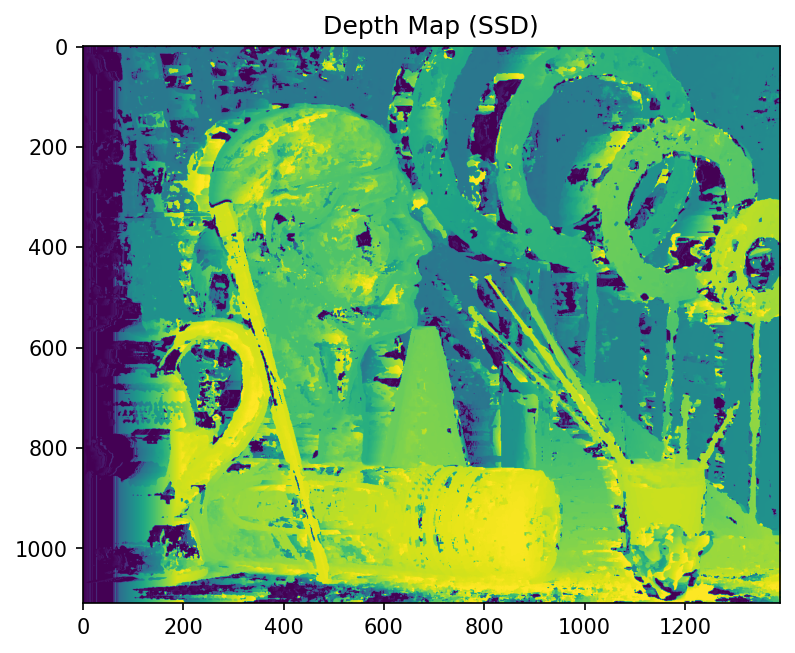

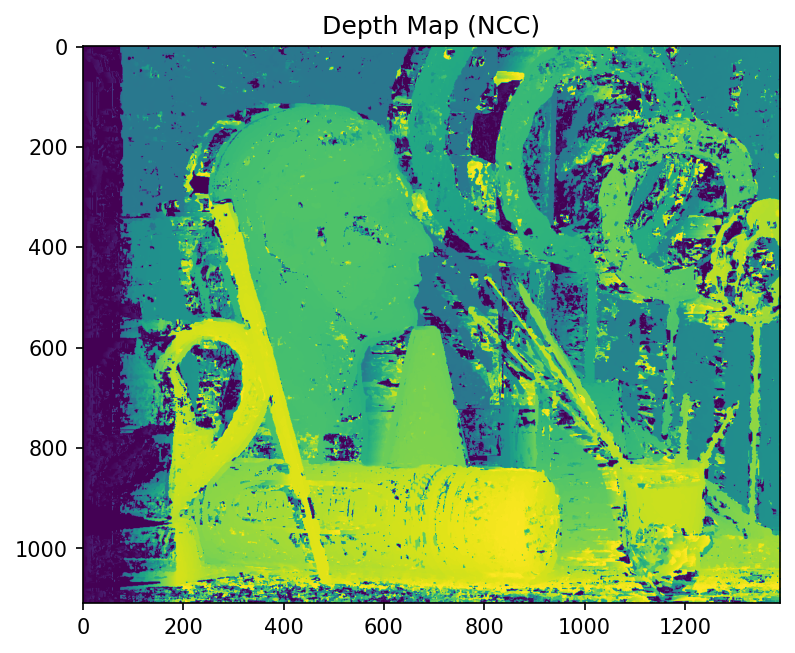

In [41]:
figure(figsize=(6, 6), dpi=150)
plt.imshow(disp_to_img(disparity_map(image_a, image_b)))
plt.title('Depth Map (SSD)')

figure(figsize=(6, 6), dpi=150)
plt.imshow(disp_to_img(disparity_map(image_a, image_b, mode='ncc')))
plt.title('Depth Map (NCC)')

# Graph Cut based matching
Eventhough we are going to improve the patch matching by the method in "Computing Visual Correspondence with
Occlusions via Graph Cuts", but his later journal paper "Kolmogorov and Zabih’s Graph Cuts Stereo Matching Algorithm" gives a better explaination (at least to me).  So I will mainly reference codes and paper in this link:
https://www.ipol.im/pub/art/2014/97/?utm_source=doi

the python implemetation is from 
https://github.com/sjawhar/cv-stereo-disparity-graph-cuts

I tried to understand every detail of this code as much as possible

Not sure if I can wirte a simple version of it, to show that I'm totally understand this algorithm

In [10]:
import maxflow
import numpy as np
import sys
from matplotlib.pyplot import figure
from tqdm import tqdm

def disparity_graphcut(image_left, image_right, **kwargs):
    solver = GraphCutDisparitySolver(image_left, image_right, **kwargs)
    return solver.solve()

def load_img_to_gray(img_p):
    return np.array(Image.open(img_p).convert("L")).astype(float)

# Based on https://github.com/pmonasse/disparity-with-graph-cuts
class GraphCutDisparitySolver:
    LABEL_OCCLUDED = 1

    NODE_ALPHA = -1
    NODE_ABSENT = -2

    IS_NODE = lambda x: x >=0

    def __init__(
        self,
        image_left,
        image_right,
        always_randomize=False,
        search_depth=30,
        max_levels=-1,
        max_iterations=4,
        occlusion_cost=-1,
        smoothness_cost_high=-1,
        smoothness_cost_low=-1,
        smoothness_threshold=8,
    ):
        # TODO: Validate params
        self.always_randomize = always_randomize
        self.max_levels = search_depth if max_levels < 0 else max_levels
        self.max_iterations = max_iterations
        self.occlusion_cost = occlusion_cost
        # use given cost or default
        self.smoothness_cost_low = smoothness_cost_low if smoothness_cost_low > 0 else 0.2 * self.occlusion_cost
        self.smoothness_cost_high = smoothness_cost_high if smoothness_cost_high > 0 else 3 * self.smoothness_cost_low
        self.smoothness_threshold = smoothness_threshold

        self.image_left = image_left.astype(float)
        self.image_right = image_right.astype(float)
        self.image_shape = self.image_left.shape
        self.image_size = self.image_left.size
        self.image_indices = np.indices(self.image_shape)
        self.energy = float('inf')

        search_interval = (search_depth // self.max_levels) + bool(search_depth % self.max_levels)
        self.search_levels = -1 * np.arange(0, search_depth + 1, search_interval)[::-1]
        # what search level, search depth, and rank?
        rank = np.empty(len(self.search_levels), dtype=int)
        rank[np.argsort(self.search_levels)] = np.arange(len(self.search_levels))
        self.label_rank = dict(zip(self.search_levels, rank))
        self.build_neighbors()

    def is_in_image(self, x):
        return (0 <= x) & (x < self.image_shape[1])

    def build_neighbors(self):
        ## find the neighbor pixel difference between left and right image
        ## (to up and to right), then record which location have the pixel 
        ## difference less than the smooth threshold
        
        # generate the indices for one image 
        indices = np.indices(self.image_shape)
        # feels like p means indices for left image
        # q means indices for right image
        neighbors_one_p = indices[:, 1:, :].reshape(2, -1)
        neighbors_one_q = neighbors_one_p + [[-1],[0]]
        neighbors_two_p = indices[:, :, :-1].reshape(2, -1)
        neighbors_two_q = neighbors_two_p + [[0],[1]]
        ## what the difference between self.neighbors and self.neighbors_rolled?
        # so here it just compute the upper and right neighbours, why don't compute the rest two kinds of them?
        # for time saving?
        self.neighbors = np.array([
            np.concatenate([neighbors_one_p, neighbors_two_p], axis=1), # concate all p indices, this will double the number of indices
            np.concatenate([neighbors_one_q, neighbors_two_q], axis=1), # concate all q indices
        ])
        # all y coordination in q and p, all x cooordination in q and p
        # but, how to use this indices?
        '''
        a = array([[[ 1,  2,  3],
                    [ 4,  5,  6]],

                   [[ 7,  8,  9],
                    [10, 11, 12]]])
        
        np.rollaxis(a, 1) = 
            array([[[ 1,  2,  3],
                    [ 7,  8,  9]],

                   [[ 4,  5,  6],
                    [10, 11, 12]]])

        '''
        self.neighbors_rolled = tuple(np.rollaxis(self.neighbors, 1))
        indices_p, indices_q = self.neighbors
        diff_left = self.image_left[tuple(indices_p)] - self.image_left[tuple(indices_q)]
        # find the pixel in left image that is smooth (less than the smoothness_threshold)
        self.is_left_under = np.abs(diff_left) < self.smoothness_threshold

    def solve(self):
        ## main entry
        # initialize the labels as all occluded?
        self.labels = np.full(self.image_shape, self.LABEL_OCCLUDED, dtype=int)
        # initialize the finished label table as all False, cause no labels have been refined yet
        label_done = np.zeros(len(self.search_levels), dtype=bool)

        for i in range(self.max_iterations):
            print("Log:\titerate %d / %d"%(i, self.max_iterations))
            # initialize the label_order only once or everytime
            
            if i == 0 or self.always_randomize:
                label_order = np.random.permutation(self.search_levels)

            for label in tqdm(label_order):
                # print('iteration', i, 'label', label)
                label_index = self.label_rank[label]
                if label_done[label_index]:
                    continue

                is_expanded = self.expand_label(label)
                # if expanded happened, then reset all label records
                if is_expanded:
                    label_done[:] = False
                label_done[label_index] = True

            if label_done.all():
                break

        return -1 * self.labels

    def expand_label(self, label):
        is_expanded = False
        # why times 2 and times 12?
        # but accord to the tutorial:
        # http://pmneila.github.io/PyMaxflow/tutorial.html
        # the setting here doesn't matter
        g = maxflow.Graph[int](2*self.image_size, 12*self.image_size)
        # print('Adding data+occlusion terms for', label)
        self.add_data_occlusion_terms(g, label)
        # print('Adding smoothness terms for', label)
        self.add_smoothness_terms(g, label)
        # print('Adding uniqueness terms for', label)
        self.add_uniqueness_terms(g, label)

        energy = g.maxflow() + self.e_data_occlusion
        if energy < self.energy:
            # print('new energy', energy, 'updating labels', label)
            self.update_labels(g, label)
            is_expanded = True
        self.energy = energy
        return is_expanded

    def add_data_occlusion_terms(self, g, label):
        indices_y, indices_x = self.image_indices
        # this is a expansion, so we need to pick out pixels that have the target label already first
        is_label = self.labels == label
        # find the rest pixels that still have occluded label
        is_occluded = self.labels == self.LABEL_OCCLUDED
        # shift the pixel that is not occluded
        indices_shifted = np.where(is_occluded, indices_x, indices_x + self.labels)
        # assert self.is_in_image(indices_shifted[np.logical_not(is_occluded)]).all()
        # compute the pixel different 
        ssd_active = np.square(self.image_left - self.image_right[indices_y, indices_shifted]) - self.occlusion_cost
        # looks like a cost assignment...
        ssd_active[is_occluded | is_label] = -self.occlusion_cost - 1
        
        nodes_active = np.zeros(self.image_shape, dtype=int)
        # I guess this are two labels that indicate two different nodes
        # but I still can't understand its logic here
        nodes_active[is_occluded] = self.NODE_ABSENT
        nodes_active[is_label] = self.NODE_ALPHA
        # find the rest pixels that could be flipped in the expansion
        is_node_active = np.logical_not(is_label | is_occluded)
        # what this term does?
        e_data_occlusion = ssd_active[is_label].sum()
        # find all occluded pixels, but what the difference to the previous one?
        is_occluded = np.logical_not(self.is_in_image(indices_x + label))
        indices_shifted = np.where(is_occluded, indices_x, indices_x + label)
        ssd_label = np.square(self.image_left - self.image_right[indices_y, indices_shifted]) - self.occlusion_cost
        ssd_label[is_occluded | is_label] = -self.occlusion_cost - 1
        nodes_label = np.zeros(self.image_shape, dtype=int)
        nodes_label[is_occluded] = self.NODE_ABSENT
        nodes_label[is_label] = self.NODE_ALPHA
        is_node_label = np.logical_not(is_label | is_occluded)
        # add nodes
        num_nodes = is_node_label.sum() + is_node_active.sum()
        node_ids = g.add_nodes(num_nodes)
        node_index = 0
        # for each pixel in left image, 
        for row, col in np.ndindex(self.image_shape):
            # don't quite understand this branch
            if is_node_active[row, col]:
                node_id = node_ids[node_index]
                nodes_active[row, col] = node_id
                node_index += 1
                cost_active = ssd_active[row, col]
                # assert cost_active >= -self.occlusion_cost
                g.add_tedge(node_id, 0, cost_active)

            if is_node_label[row, col]:
                node_id = node_ids[node_index]
                nodes_label[row, col] = node_id
                node_index += 1
                cost_label = ssd_label[row, col]
                # assert cost_label >= -self.occlusion_cost
                g.add_tedge(node_id, cost_label, 0)

        # assert node_index == num_nodes
        self.is_node_active = is_node_active
        self.is_node_label = is_node_label
        self.nodes_active = nodes_active
        self.nodes_label = nodes_label
        self.e_data_occlusion = e_data_occlusion

    def add_smoothness_terms(self, g, label):
        # get neighbors pixel's disparity, which will be used for shifting the image
        ## all x-indices of q and p, all y-indices...  =  self.neighbors_rolled
        # I think my understanding is correct, this should related to how numpy indexing the values in the array
        # self.neighbors_rolled is the index that could be used directly to select pixels or labels
        labels_p, labels_q = self.labels[self.neighbors_rolled]
        # labels_p, labels_q = self.labels[self.neighbors] 
        penalty_label = self.get_smoothness_penalty(label)
        penalty_active_p = self.get_smoothness_penalty(labels_p)
        penalty_active_q = self.get_smoothness_penalty(labels_q)

        indices_p, indices_q = self.neighbors
        is_p_in_range = self.is_in_image(indices_p[1, :] + labels_q)
        is_q_in_range = self.is_in_image(indices_q[1, :] + labels_p)

        for neighbor_index in range(self.neighbors.shape[2]):

            indices_y, indices_x = self.neighbors.T[neighbor_index]
            # get the p, q's diparity
            label_p, label_q = self.labels[indices_y, indices_x]
            # get the node index in the graph, which has been intialized in the occlussion cost computation
            node_l_p, node_l_q = self.nodes_label[indices_y, indices_x]
            node_a_p, node_a_q = self.nodes_active[indices_y, indices_x]
            # check if the current pixel is changeable
            is_p_active, is_q_active = self.is_node_active[indices_y, indices_x]
            # if the pixle exists on both left and right images?
            # and I also believe here is adding the Edata term
            if node_l_p != self.NODE_ABSENT and node_l_q != self.NODE_ABSENT:
                penalty = penalty_label[neighbor_index]
                # assert penalty > 0
                # the alpha node, which is the pixel that areadly have the same label as alpha-expansion 
                # so here is only add nodes that is potentially could be changed to alpha
                if node_l_p != self.NODE_ALPHA and node_l_q != self.NODE_ALPHA:
                    self.add_smoothness_weights(g, node_l_p, node_l_q, 0, penalty, penalty, 0)
                elif node_l_p != self.NODE_ALPHA:
                    g.add_tedge(node_l_p, 0, penalty)
                elif node_l_q != self.NODE_ALPHA:
                    g.add_tedge(node_l_q, 0, penalty)

            penalty_p, penalty_q = penalty_active_p[neighbor_index], penalty_active_q[neighbor_index]

            if label_p == label_q:
                if not is_p_active or not is_q_active:
                    continue
                # assert label_p != label and label_p != self.LABEL_OCCLUDED
                # assert penalty_p > 0
                self.add_smoothness_weights(g, node_a_p, node_a_q, 0, penalty_p, penalty_p, 0)
                continue

            if is_p_active and is_q_in_range[neighbor_index]:
                # assert penalty_p > 0
                g.add_tedge(node_a_p, 0, penalty_p)

            if is_q_active and is_p_in_range[neighbor_index]:
                # assert penalty_q > 0
                g.add_tedge(node_a_q, 0, penalty_q)

    def _shift(self, indices, shift):
        _, width = self.image_shape
        indices_shifted = np.copy(indices)
        indices_shifted[1, :] += shift
        is_in_image = self.is_in_image(indices_shifted[1, :])
        indices_shifted[1, :] = np.clip(indices_shifted[1, :], 0, width - 1)
        return indices_shifted, is_in_image

    def get_smoothness_penalty(self, labels):
        ## compute every pixel's smoothness cost by the given labels (disparity)
        indices_p, indices_q = self.neighbors
        if type(labels) is np.ndarray:
            labels = labels[self.is_left_under]
        # for each pixel, initial its smoothness value?
        smoothness = np.full(indices_p.shape[1], self.smoothness_cost_low, dtype=float)

        # pick up all pixel indices that are smooth 
        # then shift them by the current disparity
        indices_p_shifted, is_p_in_image = self._shift(indices_p[:, self.is_left_under], labels)
        indices_q_shifted, is_q_in_image = self._shift(indices_q[:, self.is_left_under], labels)
        # why shift right image twice?
        diff_right = self.image_right[tuple(indices_p_shifted)] - self.image_right[tuple(indices_q_shifted)]

        is_left_under = np.copy(self.is_left_under)
        is_left_under[is_left_under] = np.abs(diff_right) < self.smoothness_threshold
        # add the high smoothness cost for the graph construction
        smoothness[is_left_under] = self.smoothness_cost_high

        is_left_under[:] = self.is_left_under
        is_left_under[is_left_under] = np.logical_not(is_p_in_image & is_q_in_image)
        smoothness[is_left_under] = 0

        return smoothness

    def add_smoothness_weights(self, g, node1, node2, w1, w2, w3, w4):
        # what the meaning of w1 to w4?
        # 0, penalty, penalty, 0
        w0 = w1 - w2
        g.add_tedge(node1, w4, w2)
        g.add_tedge(node2, 0, w0)
        # http://pmneila.github.io/PyMaxflow/tutorial.html

        g.add_edge(node1, node2, 0, w3 - w4 - w0)

    def add_uniqueness_terms(self, g, label):
        # assert (self.labels[self.is_node_active] != self.LABEL_OCCLUDED).all()
        # I believe here is to make sure the uniqueness before and after shifted the right image
        _, width = self.image_shape
        indices_y, indices_x = self.image_indices
        indices_shifted = indices_x + self.labels - label
        is_shift_valid = self.is_in_image(indices_shifted)
        indices_shifted = np.clip(indices_shifted, 0, width - 1)
        forbid = self.is_node_active & is_shift_valid
        forbid_label = self.nodes_label[indices_y, indices_shifted][forbid]
        forbid_active = self.nodes_active[forbid]
        self.add_uniqueness_weights(g, forbid_active, forbid_label)
        # assert (forbid_label >= 0).all()
        # assert (forbid_active >= 0).all()

        is_node_label = self.nodes_label != self.NODE_ABSENT
        forbid = self.is_node_active & is_node_label
        self.add_uniqueness_weights(g, self.nodes_active[forbid], self.nodes_label[forbid])
        # assert (self.nodes_label[forbid] >= 0).all()
        # assert (self.nodes_active[forbid] >= 0).all()

    def add_uniqueness_weights(self, g, sources, targets):
        for i in range(sources.size):
            # this is creating a one way edge from source to target
            # but how can this add the uniqueness?
            g.add_edge(sources[i], targets[i], sys.maxsize, 0)

    def update_labels(self, g, label):
        is_node_active = np.copy(self.is_node_active)
        if is_node_active.any():
            nodes_active = self.nodes_active[is_node_active]
            # how this assignment could be always possible?
            is_node_active[is_node_active] = g.get_grid_segments(nodes_active)
            self.labels[is_node_active] = self.LABEL_OCCLUDED

        # so... self.is_node_label is never been updated?
        is_node_label = np.copy(self.is_node_label)
        if is_node_label.any():
            nodes_label = self.nodes_label[is_node_label]
            is_node_label[is_node_label] = g.get_grid_segments(nodes_label)
            self.labels[is_node_label] = label


log:	opening aloe


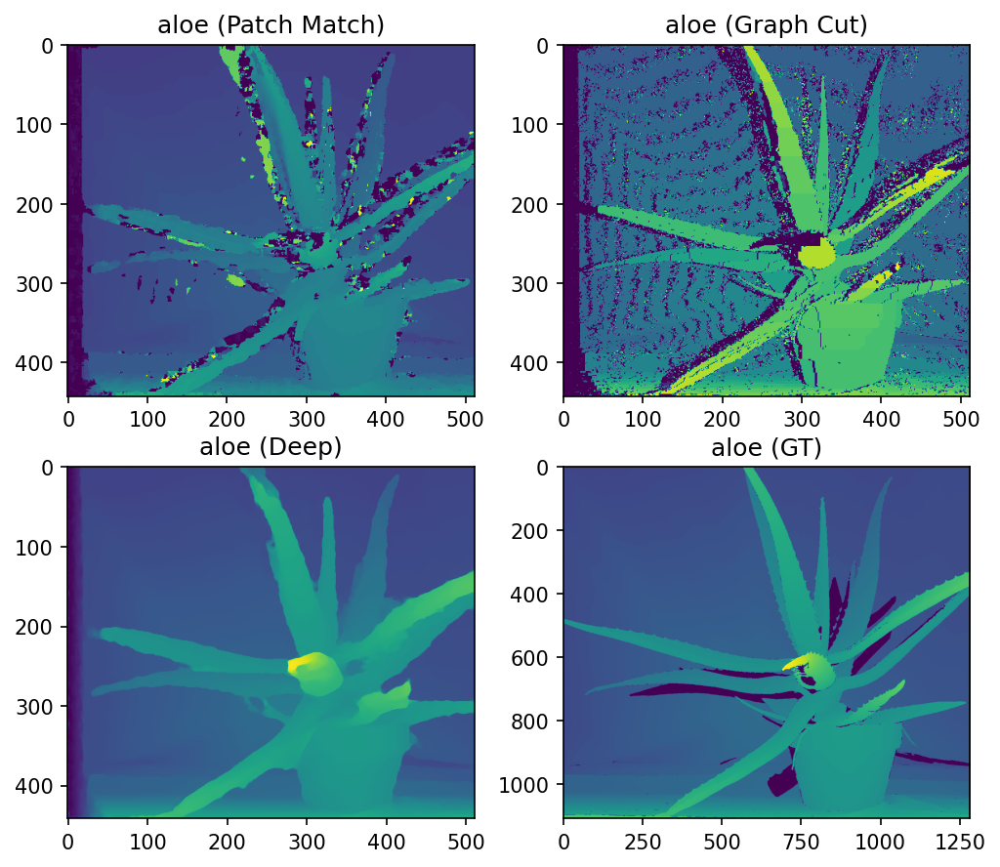

log:	opening tsukuba


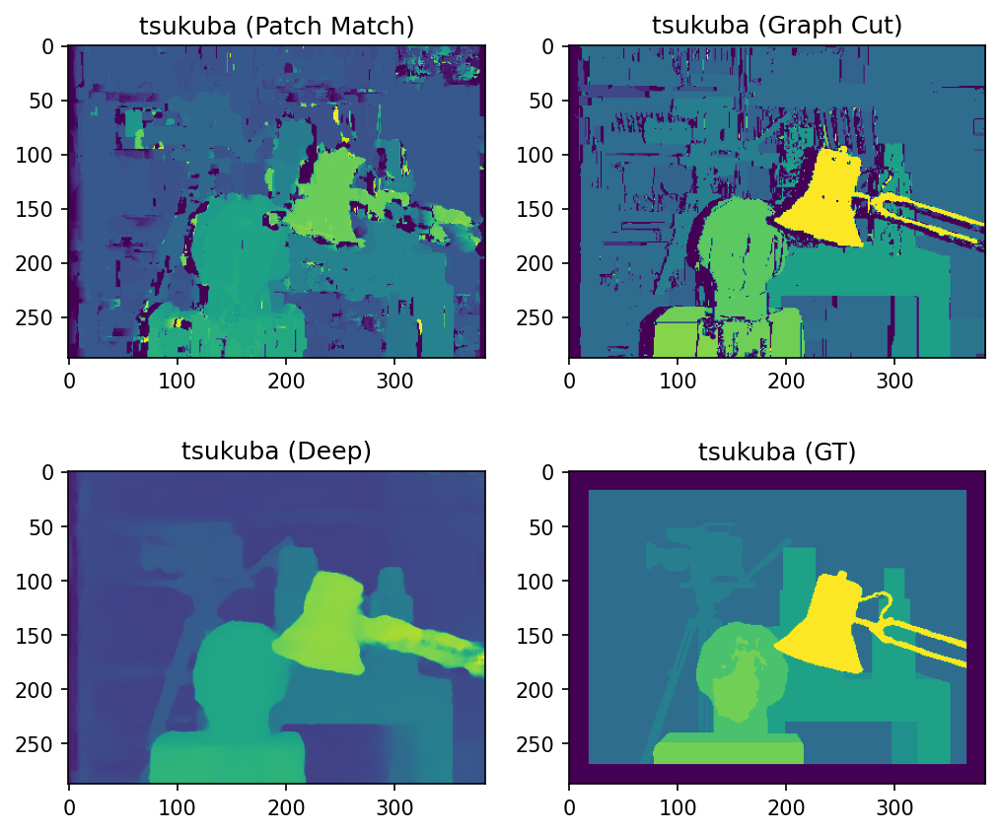

log:	opening bull


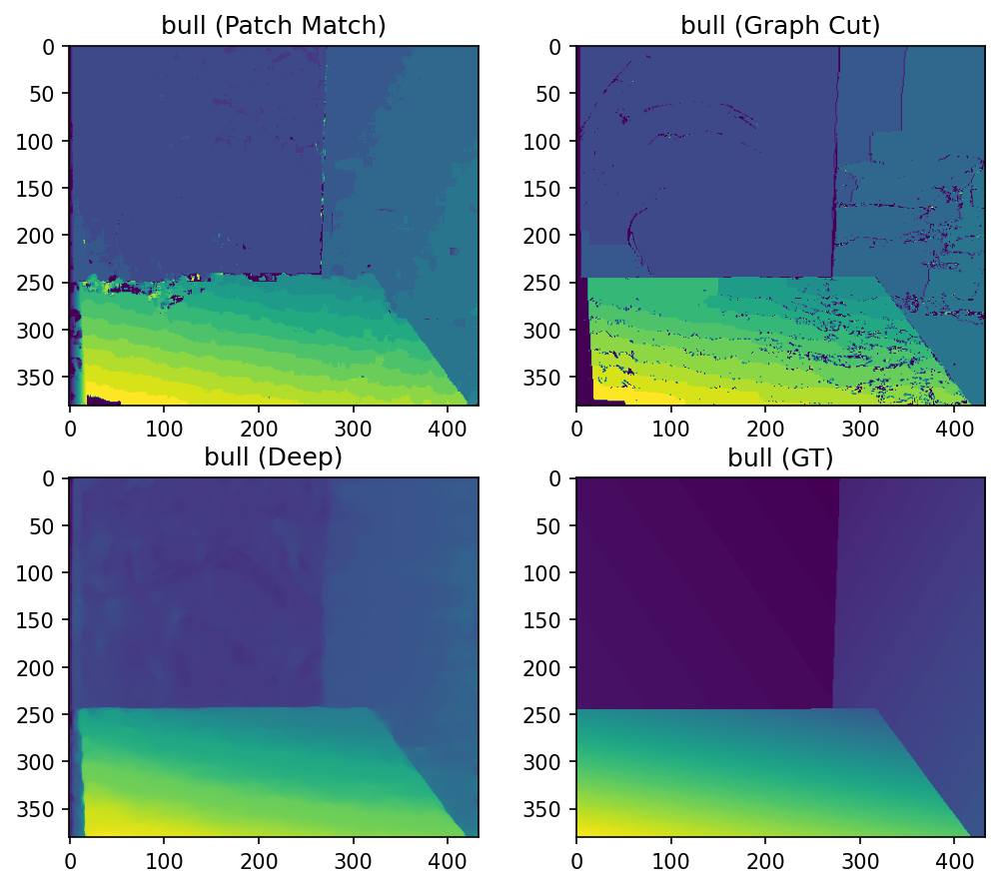

log:	opening laundry


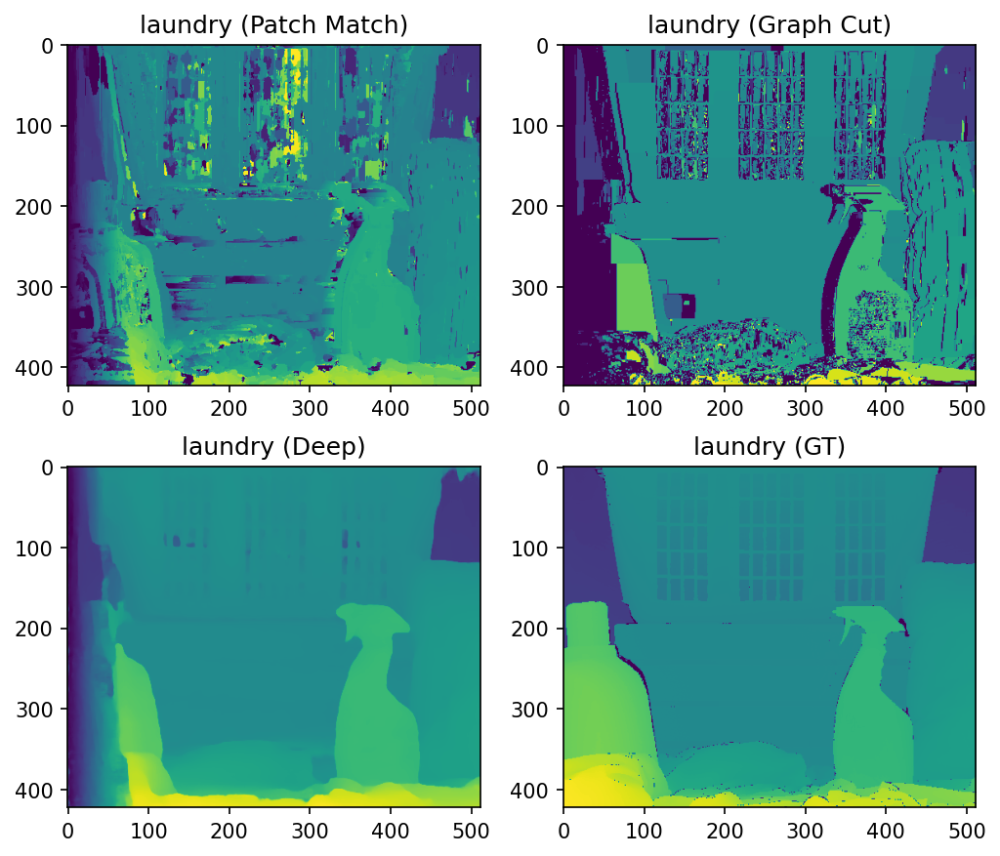

log:	opening art


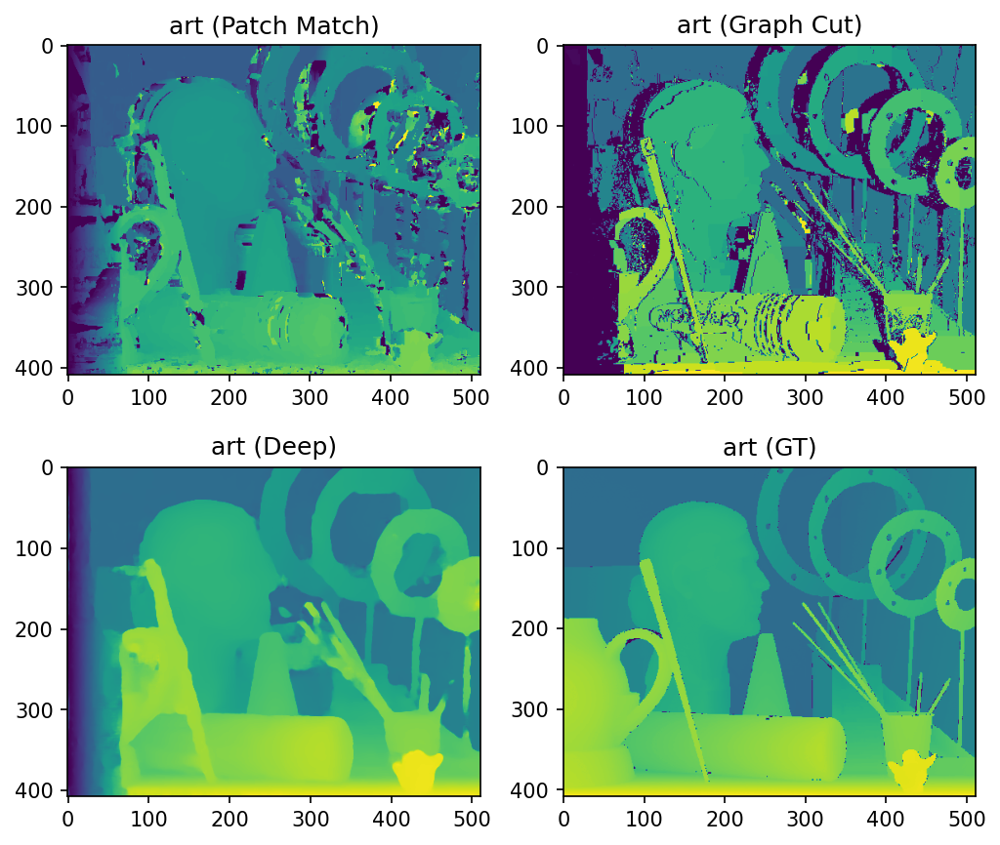

log:	opening barn1


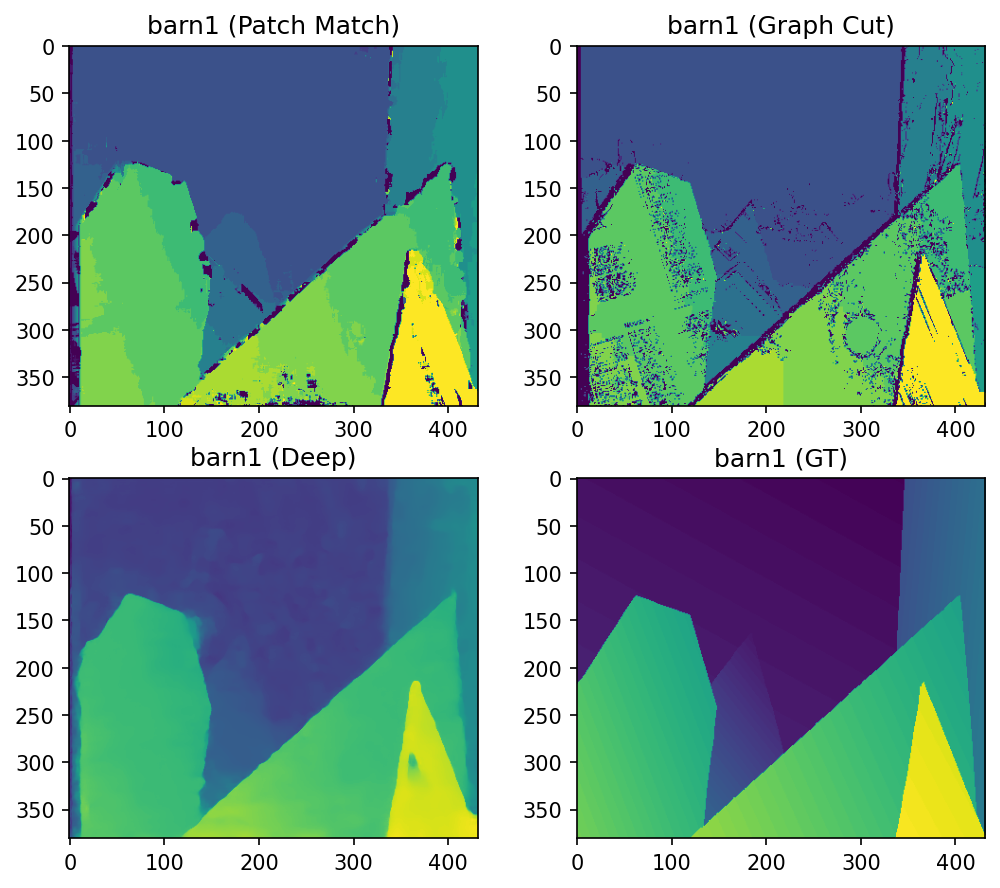

log:	opening books


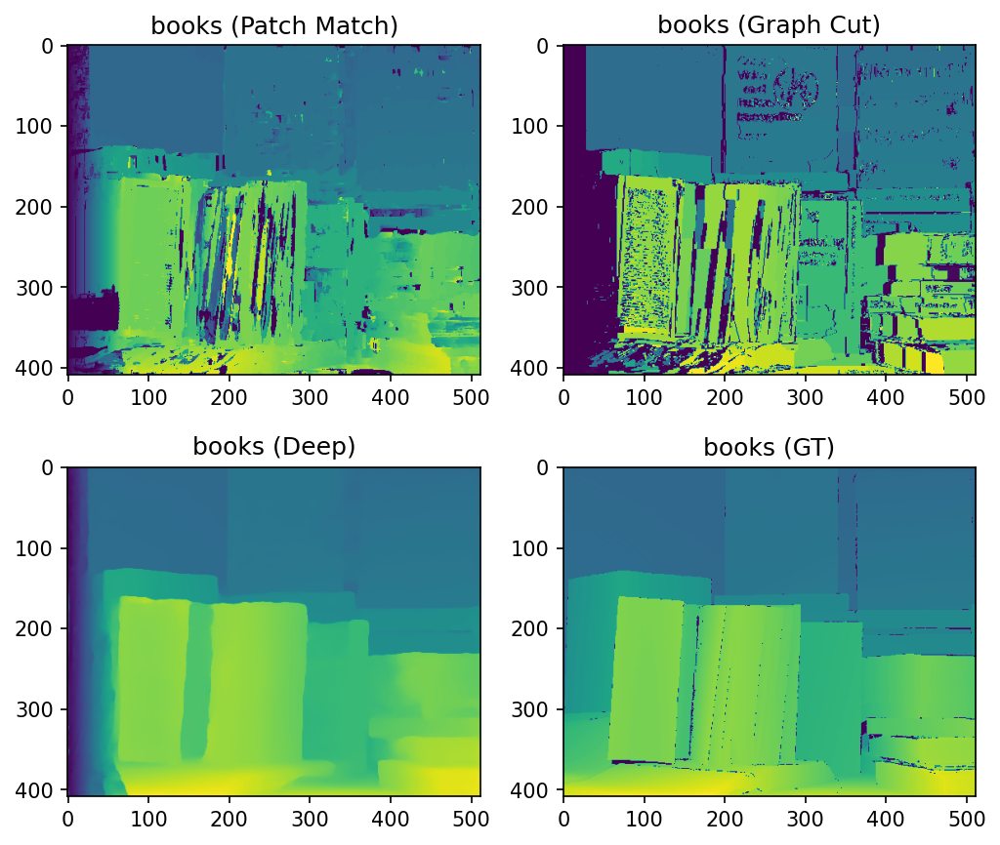

log:	opening map


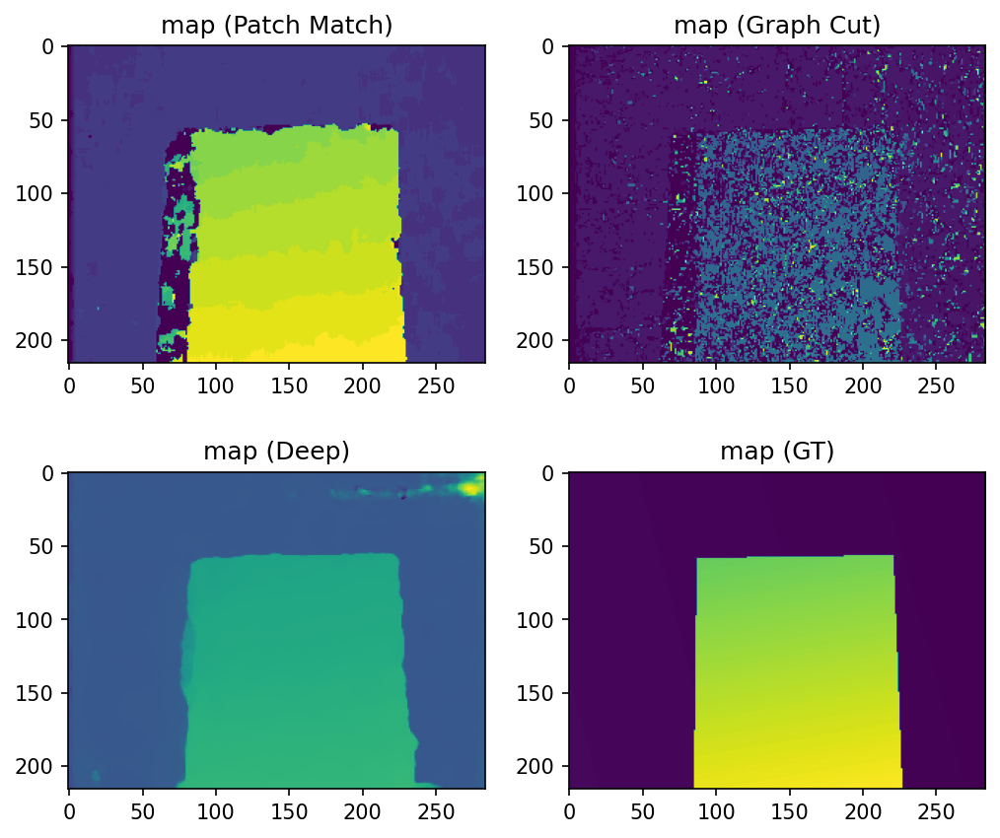

log:	opening barn2


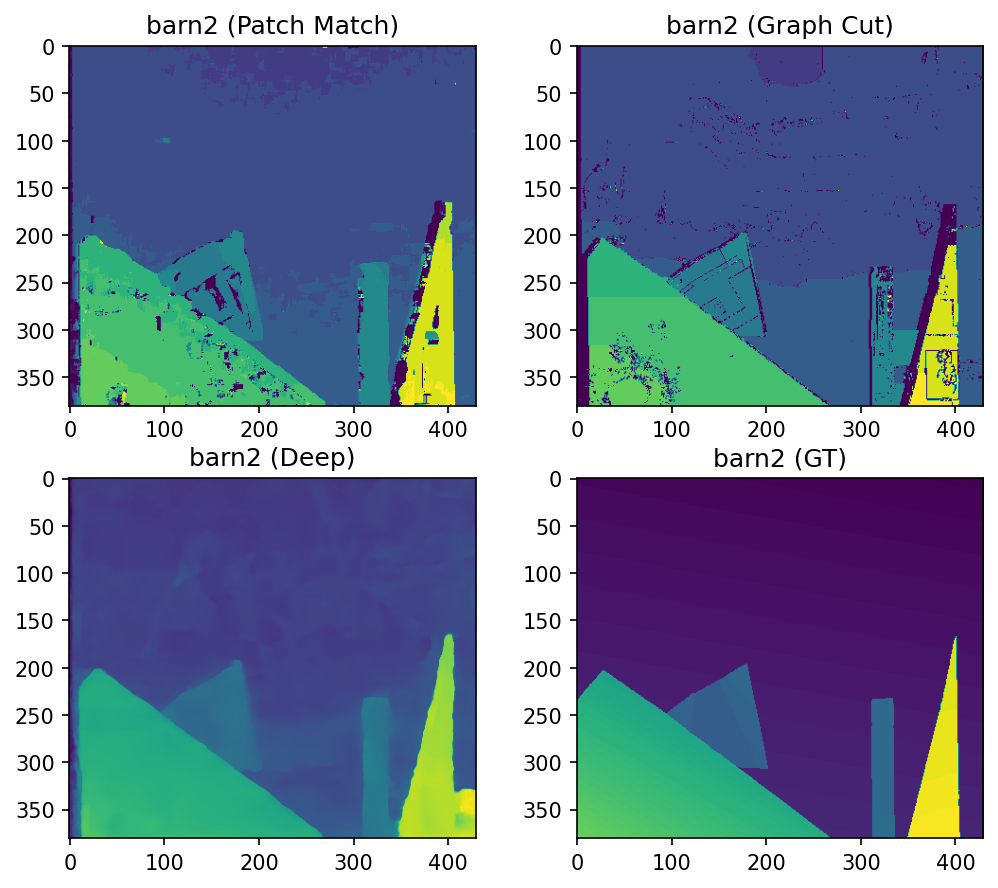

log:	opening poster


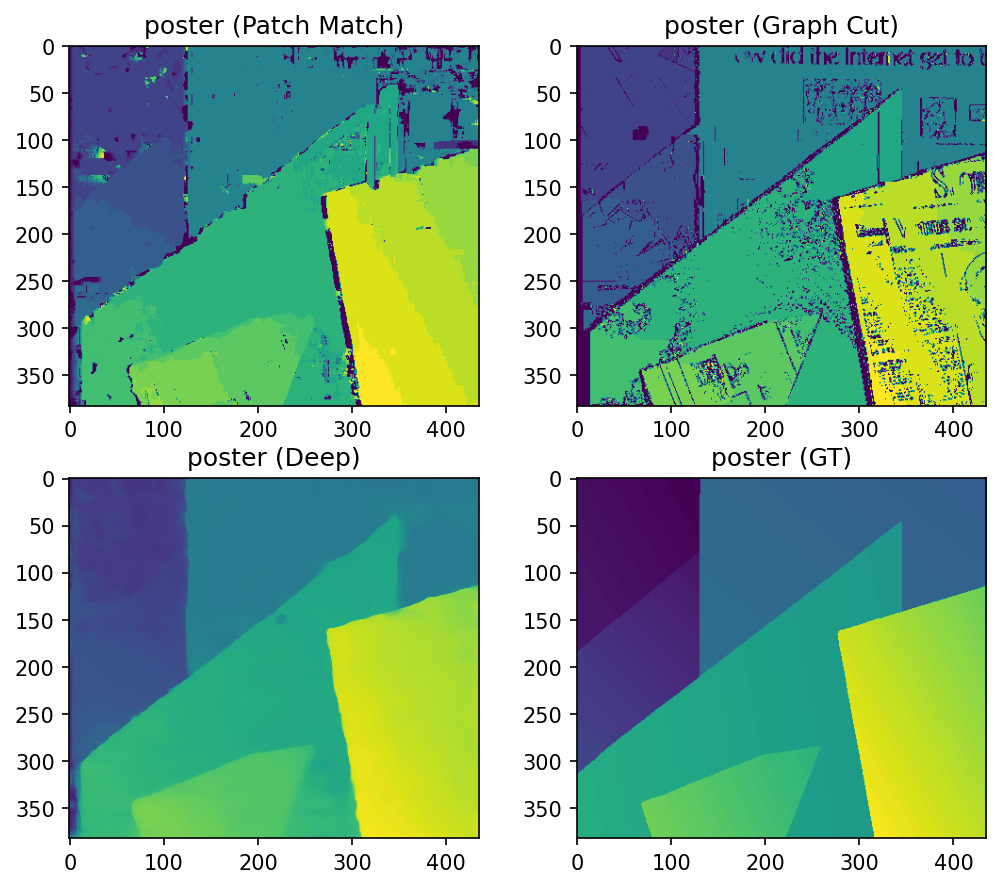

In [105]:
# let's try to run all the results together
import os
from os.path import exists

def img_norm(img):
    return (img / img.max()) * 255
    
def gross_error(img1, img2, norm=False):
    w = img1.shape[1]
    h = img1.shape[0]
    img2 = cv2.resize(img2, (w, h), interpolation = cv2.INTER_NEAREST)
    if norm:
        ge = np.absolute(disp_to_img(img1) - img_norm(img2))
    else:
        ge = np.absolute(img1 - img2)
    ge[img2 == 0] = 0
    ge = (ge > 3).sum() / img1.size
    l1 = np.absolute(disp_to_img(img1) - img_norm(img2)).sum() / img1.size
    return ge, l1


l1_gc_d1 = []
l1_st_d1 = []
ge_gc_d1 = []
ge_st_d1 = []
ge_pm_d1 = []
name = []
for f in os.listdir('data'):
    if "zip" in f: continue
    if ".DS_Store" in f: continue
    if "driving_stereo" in f: continue
    print("log:\topening %s"%f)
    name.append(f)
    image_left = load_img_to_gray('data/%s/im0.png'%f)
    image_right = load_img_to_gray('data/%s/im1.png'%f)
    disp_dp = load_img_to_gray('data/%s/disp_pred.png'%f)
    disp_gt = load_img_to_gray('data/%s/disp0.png'%f)
    if exists('data/%s/disp_pm.npy'%f):
        with open('data/%s/disp_pm.npy'%f, 'rb') as fp:
            disp_pm = np.load(fp)
    else:
        disp_pm = disparity_map(image_left, image_right, mode='ncc')
        with open('data/%s/disp_pm.npy'%f, 'wb') as fp:
            np.save(fp, disp_pm)    
    if exists('data/%s/disp_gc.npy'%f):
        with open('data/%s/disp_gc.npy'%f, 'rb') as fp:
            disp_gc = np.load(fp)
    else:
        disp_gc = disparity_graphcut(image_left, 
                                    image_right,
                                    search_depth=100,
                                    occlusion_cost=80)
        with open('data/%s/disp_gc.npy'%f, 'wb') as fp:
            np.save(fp, disp_gc)
    # filter out impossible disparity values
    figure(figsize=(8, 7), dpi=150)
    plt.subplot(2,2,1)
    plt.imshow(disp_to_img(disp_pm))
    plt.title('%s (Patch Match)'%f)
    plt.subplot(2,2,2)
    plt.imshow(disp_to_img(disp_gc))
    plt.title('%s (Graph Cut)'%f)
    plt.subplot(2,2,3)
    plt.imshow(disp_dp)
    plt.title('%s (Deep)'%f)
    plt.subplot(2,2,4)
    plt.imshow(disp_gt)
    plt.title('%s (GT)'%f)
    plt.show()
    # compute the error rate of each prediction result
    ge, l1 = gross_error(disp_pm, disp_gt)
    ge_pm_d1.append(ge)
    ge, l1 = gross_error(disp_gc, disp_gt)
    ge_gc_d1.append(ge)
    l1_gc_d1.append(l1)
    ge, l1 = gross_error(disp_st, disp_gt)
    ge_st_d1.append(ge)
    l1_st_d1.append(l1)

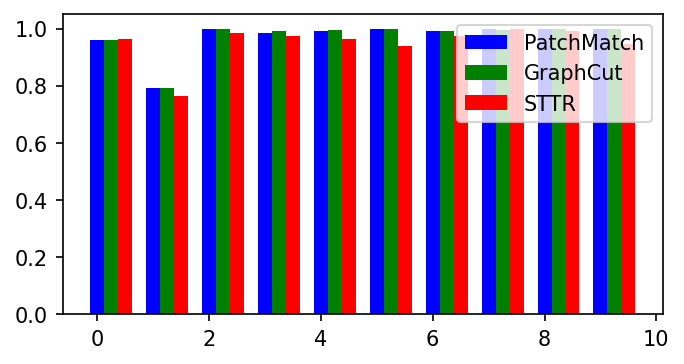

In [106]:
X = np.arange(10)
fig = plt.figure(figsize=(4, 2), dpi=150)
ax = fig.add_axes([0,0,1,1])
ax.bar(X + 0.00, ge_pm_d1, color = 'b', width = 0.25)
ax.bar(X + 0.25, ge_gc_d1, color = 'g', width = 0.25)
ax.bar(X + 0.5, ge_st_d1, color = 'r', width = 0.25)
ax.legend(['PatchMatch','GraphCut', 'STTR'])

log:/topening 2018-07-11-14-48-52_2018-07-11-14-50-08-769.jpg


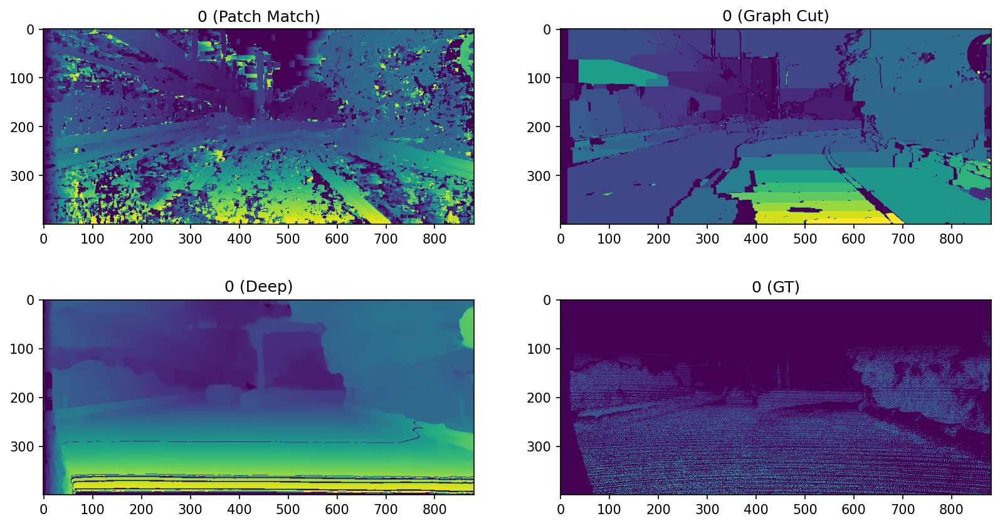

log:/topening 2018-07-11-14-48-52_2018-07-11-14-50-10-370.jpg


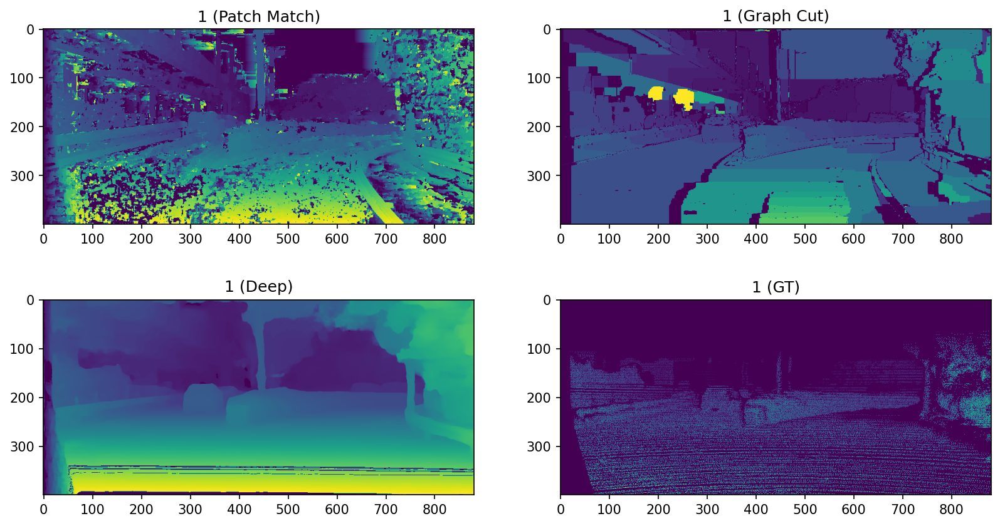

log:/topening 2018-07-11-14-48-52_2018-07-11-14-50-22-775.jpg


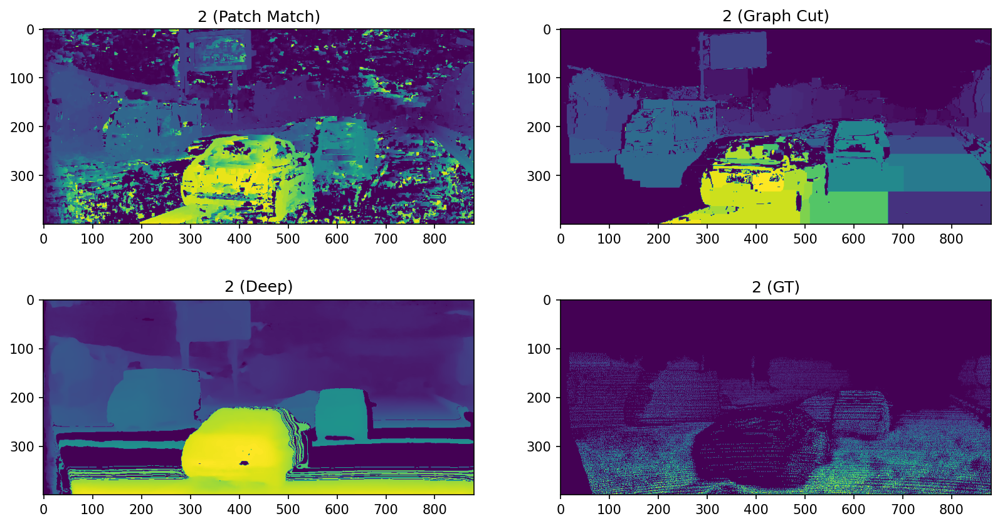

log:/topening 2018-07-11-14-48-52_2018-07-11-14-51-00-222.jpg


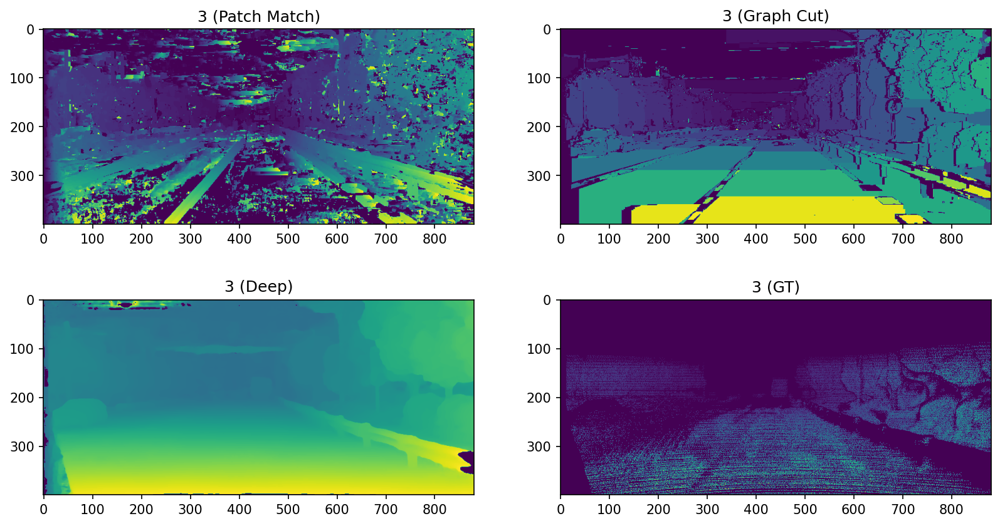

log:/topening 2018-07-11-14-48-52_2018-07-11-14-51-12-936.jpg


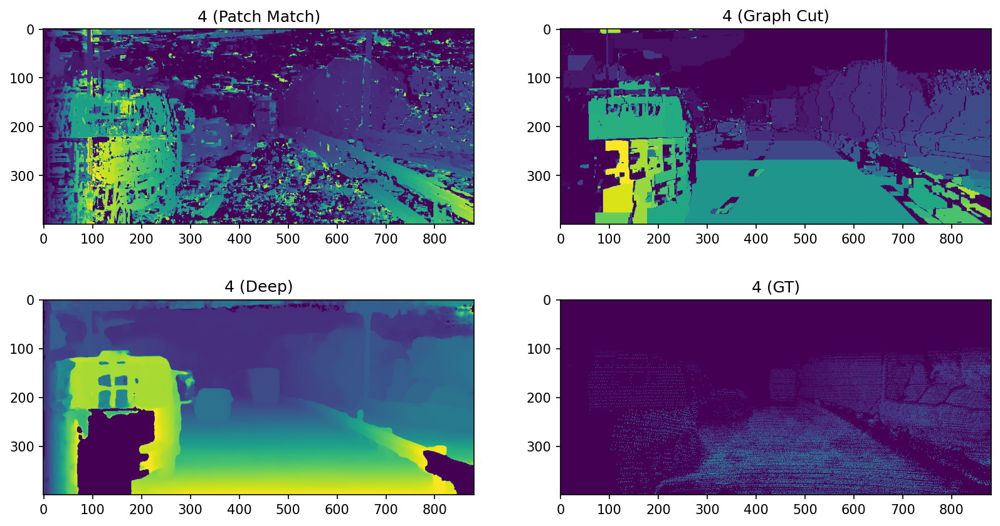

In [103]:
# let's try to run all the results together
import os
from os.path import exists
counter = 0
fl = os.listdir("data/driving_stereo/left")
fl.sort()
l1_gc_d2 = []
l1_st_d2 = []
ge_gc_d2 = []
ge_st_d2 = []
ge_pm_d2 = []
for f in fl:
    if "zip" in f: continue
    if ".DS_Store" in f: continue
    print("log:/topening %s"%f)
    image_left = load_img_to_gray('data/driving_stereo/left/%s'%f)
    image_right = load_img_to_gray('data/driving_stereo/right/%s'%f)
    disp_gt = load_img_to_gray('data/driving_stereo/output/%d_disp.png'%counter)
    disp_dp = load_img_to_gray('data/driving_stereo/output/%d_disp_pred.png'%counter)
    if exists('data/driving_stereo/%s_pm.npy'%f):
        with open('data/driving_stereo/%s_pm.npy'%f, 'rb') as fp:
            disp_pm = np.load(fp)
    else:
        disp_pm = disparity_map(image_left, image_right, mode='ncc')
        with open('data/driving_stereo/%s_pm.npy'%f, 'wb') as fp:
            np.save(fp, disp_pm)    
    if exists('data/driving_stereo/%s_gc.npy'%f):
        with open('data/driving_stereo/%s_gc.npy'%f, 'rb') as fp:
            disp_gc = np.load(fp)
    else:
        disp_gc = disparity_graphcut(image_left, 
                                    image_right,
                                    search_depth=300,
                                    occlusion_cost=80,
                                    max_iterations=1)
        with open('data/driving_stereo/%s_gc.npy'%f, 'wb') as fp:
            np.save(fp, disp_gc)
    # filter out impossible disparity values
    figure(figsize=(13,7), dpi=150)
    plt.subplot(2,2,1)
    plt.imshow(disp_to_img(disp_pm))
    plt.title('%d (Patch Match)'%counter)
    plt.subplot(2,2,2)
    plt.imshow(disp_to_img(disp_gc))
    plt.title('%d (Graph Cut)'%counter)
    plt.subplot(2,2,3)
    plt.imshow(disp_to_img(disp_dp))
    plt.title('%d (Deep)'%counter)
    plt.subplot(2,2,4)
    plt.imshow(disp_gt)
    plt.title('%d (GT)'%counter)
    plt.show()
    counter += 1
    ge, l1 = gross_error(disp_pm, disp_gt)
    ge_pm_d2.append(ge)
    ge, l1 = gross_error(disp_gc, disp_gt)
    ge_gc_d2.append(ge)
    l1_gc_d2.append(l1)
    ge, l1 = gross_error(disp_st, disp_gt)
    ge_st_d2.append(ge)
    l1_st_d2.append(l1)

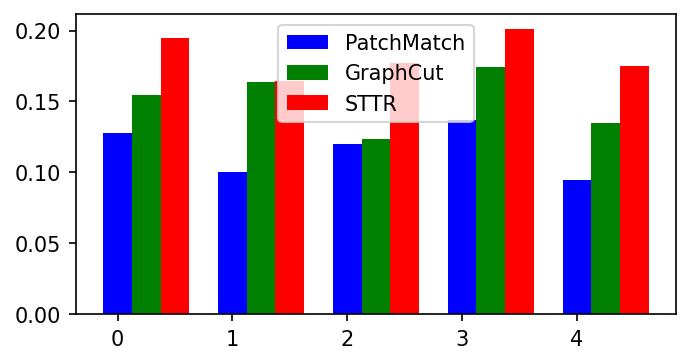

In [104]:
X = np.arange(5)
fig = plt.figure(figsize=(4, 2), dpi=150)
ax = fig.add_axes([0,0,1,1])
ax.bar(X + 0.00, ge_pm_d2, color = 'b', width = 0.25)
ax.bar(X + 0.25, ge_gc_d2, color = 'g', width = 0.25)
ax.bar(X + 0.5, ge_st_d2, color = 'r', width = 0.25)
ax.legend(['PatchMatch','GraphCut', 'STTR'])